# Importações e Bibliotecas

In [1]:
import random # Operações de aleatoriedade
import sys # Operações do sistema (print, etc)
import statistics # Operações de estatística

In [2]:
from market import Market, Produto # Importa a classe Market e a classe Produto

In [3]:
# Importações para construção gráfica do melhor indivíduo e do gráfico de evolução
from PIL import Image
from IPython.display import display
import plotly.graph_objects as go

# Valores Estáticos

In [4]:
CART: dict = {
    'Altura': 65,
    'Largura': 50,
    'Comprimento': 80,
    'PesoMaximo': 460*1000
}
CART['Capacidade'] = CART['Altura'] * CART['Largura'] * CART['Comprimento']

CART

{'Altura': 65,
 'Largura': 50,
 'Comprimento': 80,
 'PesoMaximo': 460000,
 'Capacidade': 260000}

In [5]:
MAX_MONEY: float = 1750.0
MAX_ITEMS: int = 100
MAX_CARTS: int = 200
MAX_GENERATIONS: int = 1000
BESTS: int = 5

In [6]:
MED_PRICE: float = MAX_MONEY/MAX_ITEMS
f"Preço Médio por Produto: R${MED_PRICE:.2f}"

'Preço Médio por Produto: R$17.50'

# Funções

In [7]:
m: Market = Market(r"..\data\produtos2.csv")
print(m)

Market Info
7823 products loaded.


In [8]:
def mosaic(cart: list[Produto], row_quantity: int = 5, image_size: tuple[int, int] = (300, 300)) -> None:
    """Cria um mosaico com as imagens dos produtos do carrinho"""
    
    # Lista o objeto das imagens
    images: list[Image] = [product.show(popup=False).resize(image_size) for product in cart]
    
    # Calcula o tamanho do mosaico
    mosaic_size: tuple[int, int] = (image_size[0]*row_quantity, image_size[1]*((len(images)//row_quantity)+1))
    
    # Cria a imagem do mosaico
    mosaic: Image = Image.new('RGB', mosaic_size)
    
    # Coloca as imagens no mosaico
    for i, image in enumerate(images):
        mosaic.paste(image, (image_size[0]*(i%row_quantity), image_size[1]*(i//row_quantity)))
    
    # Exibe o mosaico
    display(mosaic) 

In [9]:
def plot_generations(data: dict[int, dict[str, float]]) -> None:
    """Plota um gráfico com os valores de cada geração"""
    
    # Extrai as iterações e os valores
    iterations: list = list(data.keys())
    max_values: list = [data[i]['max'] for i in iterations]
    min_values: list = [data[i]['min'] for i in iterations]
    avg_values: list = [data[i]['med'] for i in iterations]

    # Cria o objeto gráfico
    fig = go.Figure()

    # Adiciona as linhas para cada variável
    fig.add_trace(go.Scatter(x=iterations, y=max_values, mode='lines+markers', name='Max', line=dict(color="#a90000")))
    fig.add_trace(go.Scatter(x=iterations, y=min_values, mode='lines+markers', name='Min', line=dict(color="#007d1d")))
    fig.add_trace(go.Scatter(x=iterations, y=avg_values, mode='lines+markers', name='Medio', line=dict(color="#356fa8")))

    # Adiciona título e rótulos
    fig.update_layout(
                    title='Gráfico de Gerações',
                    xaxis_title='Iteração',
                    yaxis_title='Valores',
                    yaxis_type='log',  #! Define o eixo y como logarítmico
                    template='plotly'
                )

    # Exibe o gráfico
    fig.show()

In [10]:
def calculate_regression(data: dict, last: int = globals()['MAX_GENERATIONS']//5) -> float:
    """ Calcula a regressão linear dos valores de uma lista de gerações das últimas N gerações """
    
    # Se a quantidade de dados for menor que o mínimo, retorna infinito
    if len(data) < last:
        return float("inf")
    
    else:
        values: list = list(data.values())[-last:]
        return statistics.stdev([value.get('min') for value in values])

In [11]:
def instanciate(cart: list[int]) -> list[Produto]:
    """Instancia uma lista de produtos a partir de uma lista de IDs"""
    
    return [m.get(i) for i in cart]

In [12]:
def info(cart: list[int]) -> str:
    """ Retorna uma string com as informações do indivíduo/carrinho """
    nota: float = avaliar(cart)
    cart: list[Produto] = instanciate(cart)
    return f"[INDIVÍDUO]\n\
Nota: {nota}\n\
Tamanho: {len(cart)}\n\n\
[INFORMAÇÕES DO CARRINHO]\n\
Preço Total: R${sum([product.price for product in cart]):.2f}\n\
Peso Total: {sum([product.weight for product in cart])/1000:.2f}g\n\
Volume Total: {sum([product.volume for product in cart]):.2f}cm³\n\
Preço médio: R${sum([product.price for product in cart])/len(cart)}\n\n\
[PRODUTOS]\n\
Menor preço: R${min([product.price for product in cart])}\n\
Maior preço: R${max([product.price for product in cart])}\n\
Menor peso: {min([product.weight for product in cart])}g\n\
Maior peso: {max([product.weight for product in cart])}g\n\
Menor volume: {min([product.volume for product in cart])}cm³\n\
Maior volume: {max([product.volume for product in cart])}cm³\n\n\
[CATEGORIAS]:\n{"\n".join([f"- {category}: {[product.category for product in cart].count(category)}" for category in set([product.category for product in cart])])}\n\n\
[LISTAGEM]\n{"\n".join([f"{product.name} \t R${product.price:.2f} \t {product.weight:.2f}g \t {product.volume:.2f}cm³" for product in cart])}\n\
"

# Genético

### Geração de Indivíduos

In [13]:
def gerar_carrinho(tamanho: int = globals()['MAX_ITEMS']) -> list[int]:
    compra = []

    while len(compra) < tamanho:
        item: int = m.random()
        compra.append(item)
        
    return compra

In [14]:
c: list[int] = gerar_carrinho()
c

[1615397,
 422944,
 1534903,
 1623452,
 366024,
 393834,
 292383,
 1588339,
 364119,
 387894,
 1538468,
 1569248,
 690961,
 461950,
 473241,
 441607,
 1606355,
 361450,
 1560791,
 409753,
 1435297,
 477934,
 1340704,
 1102055,
 1571634,
 1407884,
 1555073,
 1462256,
 408427,
 1625177,
 433389,
 658731,
 1124406,
 217258,
 199107,
 426887,
 334388,
 19191,
 323487,
 1623409,
 93634,
 472096,
 364277,
 407873,
 134547,
 1616757,
 460814,
 477934,
 362589,
 1386021,
 324151,
 9067,
 306311,
 280695,
 1529607,
 1402228,
 334116,
 468392,
 456130,
 362071,
 601957,
 678580,
 12328,
 1614865,
 1600466,
 472668,
 61778,
 1386018,
 412870,
 139332,
 1606360,
 447284,
 1623265,
 430143,
 1551448,
 313262,
 1614415,
 339686,
 1450022,
 218344,
 1618774,
 483798,
 160390,
 468932,
 150385,
 466688,
 429686,
 410978,
 1467192,
 1378038,
 1468442,
 1613964,
 1341702,
 181919,
 337039,
 107174,
 1616548,
 1569137,
 441614,
 58734]

### Geração de População Inicial

In [15]:
def gerar_populacao(tamanho: int = globals()['MAX_CARTS']) -> list[list[int]]:
    return [gerar_carrinho() for _ in range(tamanho)]

In [16]:
p: list[list[int]] = gerar_populacao()
p

[[472461,
  478051,
  1607325,
  803843,
  595624,
  434981,
  313589,
  236165,
  1111953,
  1531884,
  1614042,
  449096,
  116992,
  38283,
  457109,
  181282,
  457022,
  411168,
  287414,
  1616532,
  431435,
  307046,
  430513,
  1614973,
  129701,
  328242,
  428076,
  601013,
  447282,
  195371,
  1386746,
  1111951,
  1609285,
  438270,
  290529,
  420737,
  1059365,
  159743,
  44327,
  81517,
  628733,
  1421066,
  63405,
  622809,
  1444790,
  425261,
  446928,
  394146,
  1572742,
  305905,
  1058548,
  1616282,
  1468919,
  791633,
  1435298,
  628732,
  466749,
  451056,
  425260,
  443745,
  424292,
  448295,
  1571422,
  44934,
  665354,
  17060,
  1624718,
  37810,
  450165,
  461950,
  793444,
  99503,
  581569,
  272988,
  460933,
  168387,
  1545259,
  50682,
  679348,
  70562,
  160862,
  430083,
  380653,
  1619281,
  568596,
  113887,
  1615413,
  329554,
  329010,
  1446560,
  1247029,
  1560790,
  437332,
  505562,
  73340,
  446662,
  346183,
  80090,
  37264

### Avaliação

In [ ]:
def avaliar(individuo: list[int]) -> float:
    valor_total: float = 0.0
    peso_total: float = 0.0
    volume_total: float = 0.0
    repeticoes: int = 0
    categorias: list = []
    
    pesos = {
        'essencial': 0.9,
        'alimentos': 0.85,
        'açougue': 0.9,
        'beleza-e-perfumaria': 0.55,
        'bebidas': 0.6, 
        'bebidas-alcoolicas': 0.3,
        'limpeza': 0.4,
        'cuidados-pessoais': 0.55 
    }
    
    for id in individuo:
        produto = m.get(id)
        volume_total+=produto.volume
        peso_total+=produto.weight
        valor_total+=produto.price
        categorias.append(produto.category)
        r=individuo.count(id)
        repeticoes+=(r*2) if r > 1 else 0
        
    # nota = valor_total**2
    # nota = globals()['MAX_MONEY']
    nota = 1
    
    # Ônus
    nota*= max(1, volume_total - globals()['CART']['Capacidade'])
    nota*= max(1, peso_total - globals()['CART']['PesoMaximo'])
    nota*= max(1, valor_total - globals()['MAX_MONEY'])
    nota*= max(1, repeticoes)

    # Bônus
    nota/= len(set(categorias))
    nota*= sum([pesos[c]**categorias.count(c) for c in set(categorias)])
    

    return nota**2 


In [18]:
n: float = avaliar(c)
n

1006.1601837584861

In [19]:
def mapear_notas(populacao: list[list[int]], order: str = 'asc') -> dict[float, list[int]]:
    notas: dict = {avaliar(individuo): individuo for individuo in populacao}
    
    if order == 'asc':
        return dict(sorted(notas.items()))
    
    else:
        return dict(sorted(notas.items(), reverse=True))

In [20]:
nt: dict[float, list[int]] = mapear_notas(p)
nt

{0.009194088937907824: [346183,
  345126,
  1614404,
  224285,
  27050,
  678406,
  541936,
  1623606,
  305494,
  479149,
  1571636,
  1614177,
  495812,
  313810,
  1618737,
  1624410,
  1619149,
  1624218,
  13253,
  428792,
  448848,
  1555073,
  1591454,
  430208,
  302062,
  190855,
  345034,
  420665,
  339664,
  125694,
  201984,
  1614180,
  148386,
  1606367,
  217339,
  313271,
  51365,
  302062,
  463613,
  314196,
  504744,
  302305,
  112560,
  424288,
  462211,
  590239,
  459528,
  705602,
  457802,
  1568681,
  1568236,
  325755,
  47399,
  1378036,
  1517635,
  428327,
  1614014,
  164016,
  319344,
  1072996,
  73447,
  1619257,
  340873,
  420663,
  446655,
  128869,
  1440332,
  1248489,
  1572367,
  1574775,
  1446452,
  270364,
  62352,
  416469,
  16746,
  455503,
  114662,
  616755,
  356070,
  523317,
  744075,
  175501,
  601011,
  22729,
  420147,
  1614025,
  659742,
  402281,
  225556,
  1070277,
  470307,
  199086,
  1616049,
  1406950,
  628730,
  161478

### Seleção

In [21]:
def torneio(populacao: list[list[int]]) -> list[list[int]]:
    vencedores: list[list[int] | None] = []
    
    while len(vencedores) < 2:
        competidores: list[list[int]] = random.sample(populacao, 2)
        
        if all(competidor not in vencedores for competidor in competidores):    
            if avaliar(competidores[0]) < avaliar(competidores[1]):
                vencedor: list[int] = competidores[0]
            
            elif avaliar(competidores[0]) > avaliar(competidores[1]):
                vencedor: list[int] = competidores[1]
                
            else:
                vencedor: list[int] = random.choice([competidores[0], competidores[1]])
                
            vencedores.append(vencedor)
    
    return vencedores

In [22]:
v1: list[list[int]] = torneio(p)
v1

[[103924,
  409797,
  448848,
  1440358,
  473643,
  171628,
  477014,
  344570,
  1568048,
  157185,
  658728,
  41270,
  457810,
  423311,
  1405466,
  161853,
  1615404,
  142277,
  1591455,
  347405,
  402416,
  443560,
  381474,
  1607658,
  347205,
  1623314,
  478740,
  1619033,
  181919,
  420663,
  1373023,
  131296,
  404862,
  139567,
  331607,
  90061,
  399463,
  525265,
  334112,
  1606780,
  504837,
  1572741,
  419993,
  324953,
  153540,
  283400,
  443469,
  218701,
  759384,
  95623,
  455985,
  302326,
  458896,
  1376041,
  531659,
  647057,
  653517,
  541935,
  87035,
  381475,
  430366,
  499749,
  170669,
  647057,
  119338,
  365762,
  142933,
  180705,
  433128,
  1607229,
  1445852,
  463527,
  1083528,
  391421,
  1378043,
  568450,
  1548841,
  193975,
  477320,
  1615106,
  345518,
  410953,
  108484,
  1616719,
  304965,
  166476,
  151995,
  1618588,
  1615228,
  807857,
  529773,
  1614973,
  479198,
  276654,
  326267,
  276657,
  423535,
  226086,
  

In [23]:
def roleta_viciada(populacao: list[list[int]]) -> list[list[int]]:
    fitness_list: list[float] = [1 / avaliar(individuo) for individuo in populacao]
    total_fitness: float = sum(fitness_list)
    probabilities: list[float] = [fitness / total_fitness for fitness in fitness_list]
    
    vencedores: list[list[int]] = random.choices(populacao, weights=probabilities, k=2)
    
    return vencedores

In [24]:
v2: list[list[int]] = roleta_viciada(p)
v2

[[163199,
  430083,
  4446,
  791657,
  1624140,
  1406969,
  348101,
  80428,
  1059433,
  655420,
  557523,
  499784,
  428373,
  86381,
  424886,
  435547,
  303878,
  287375,
  1618336,
  458894,
  284066,
  66655,
  462218,
  245384,
  3239,
  1072998,
  420663,
  1619102,
  51538,
  401865,
  236993,
  602692,
  1619292,
  461268,
  1219235,
  1618883,
  43619,
  1613349,
  1571958,
  435737,
  413655,
  1615223,
  1376039,
  293027,
  125883,
  349534,
  97821,
  1468901,
  478129,
  432427,
  1373027,
  434953,
  479149,
  475033,
  1614255,
  438002,
  416186,
  53481,
  267599,
  396745,
  412724,
  459994,
  119902,
  146240,
  50064,
  439750,
  269827,
  123224,
  1376039,
  431858,
  1545263,
  1522319,
  434976,
  1587804,
  121521,
  696307,
  1550450,
  750482,
  218468,
  315985,
  1614252,
  33653,
  179678,
  1592463,
  1119421,
  1406950,
  504782,
  93888,
  477893,
  1623321,
  1385604,
  125239,
  353237,
  1555097,
  1602266,
  423606,
  477921,
  617252,
  154

In [25]:
def eugenia(populacao: list[list[int]], order: str = 'asc') -> list[list[int]]:
    notas: dict[float, list[int]] = mapear_notas(populacao, order)
    melhores: list[list[int]] = list(notas.values())[:globals()['BESTS']]
    
    return melhores

In [26]:
e: list[list[int]] = eugenia(p)
e

[[346183,
  345126,
  1614404,
  224285,
  27050,
  678406,
  541936,
  1623606,
  305494,
  479149,
  1571636,
  1614177,
  495812,
  313810,
  1618737,
  1624410,
  1619149,
  1624218,
  13253,
  428792,
  448848,
  1555073,
  1591454,
  430208,
  302062,
  190855,
  345034,
  420665,
  339664,
  125694,
  201984,
  1614180,
  148386,
  1606367,
  217339,
  313271,
  51365,
  302062,
  463613,
  314196,
  504744,
  302305,
  112560,
  424288,
  462211,
  590239,
  459528,
  705602,
  457802,
  1568681,
  1568236,
  325755,
  47399,
  1378036,
  1517635,
  428327,
  1614014,
  164016,
  319344,
  1072996,
  73447,
  1619257,
  340873,
  420663,
  446655,
  128869,
  1440332,
  1248489,
  1572367,
  1574775,
  1446452,
  270364,
  62352,
  416469,
  16746,
  455503,
  114662,
  616755,
  356070,
  523317,
  744075,
  175501,
  601011,
  22729,
  420147,
  1614025,
  659742,
  402281,
  225556,
  1070277,
  470307,
  199086,
  1616049,
  1406950,
  628730,
  1614789,
  1619121,
  310945

### Crossover e Mutação

In [27]:
def cruzamento(pais: list[list[int]], chance: float = 0.80, num_pontos_corte: int = 3) -> list[list[int]]:
    pai_1: list[int] = pais[0]
    pai_2: list[int] = pais[1]

    probabilidade: float = round(random.uniform(0, 1), 2)
    if probabilidade < chance:
        pontos_corte: list[int] = sorted(random.sample(range(1, len(pai_1)), num_pontos_corte))

        filho_1: list[int | None] = []
        filho_2: list[int | None] = []

        pos_inicio: int = 0
        for i in range(num_pontos_corte):
            pos_fim = pontos_corte[i]
            filho_1 += pai_1[pos_inicio:pos_fim] if i % 2 == 0 else pai_2[pos_inicio:pos_fim]
            filho_2 += pai_2[pos_inicio:pos_fim] if i % 2 == 0 else pai_1[pos_inicio:pos_fim]
            pos_inicio = pos_fim

        # Adicionando a parte restante do genoma após o último ponto de corte
        filho_1 += pai_1[pos_inicio:]
        filho_2 += pai_2[pos_inicio:]

        return [filho_1, filho_2]

    else:
        return [pai_1, pai_2]

In [28]:
f: list[list[int]] = cruzamento(v1)
f

[[103924,
  409797,
  448848,
  30303,
  1529609,
  446654,
  54081,
  1378068,
  385253,
  349521,
  175824,
  409405,
  293658,
  345552,
  1625245,
  114723,
  1529610,
  468391,
  20814,
  413314,
  310945,
  1571633,
  46787,
  161459,
  1591033,
  324197,
  617231,
  1551348,
  1588342,
  1600561,
  442104,
  1617262,
  342386,
  1378038,
  331607,
  90061,
  399463,
  525265,
  334112,
  1606780,
  504837,
  1572741,
  419993,
  324953,
  153540,
  283400,
  443469,
  218701,
  759384,
  95623,
  455985,
  302326,
  458896,
  1376041,
  531659,
  647057,
  653517,
  541935,
  87035,
  381475,
  430366,
  499749,
  170669,
  647057,
  119338,
  365762,
  142933,
  180705,
  433128,
  1607229,
  1445852,
  463527,
  1083528,
  391421,
  1378043,
  568450,
  1548841,
  193975,
  477320,
  1615106,
  345518,
  410953,
  108484,
  1616719,
  304965,
  166476,
  151995,
  1618588,
  1615228,
  807857,
  529773,
  1614973,
  479198,
  276654,
  326267,
  276657,
  423535,
  226086,
  4

In [29]:
def mutar(populacao: list[list[int]], chance = 0.05) -> list[list[int]]: 
    mutados: list[list[int]] = []

    for individuo in populacao:
        for pos, alelo in enumerate(individuo):
            mutacao: float = round(random.uniform(0, 1), 3)

            if mutacao < chance:
                novo_gene: str = m.random(ignore_case=[alelo,]) 
                individuo: str = individuo[:pos] + [novo_gene] + individuo[pos+1:]

        mutados.append(individuo)
    
    return mutados

In [30]:
mt: list[list[Produto]] = mutar(f)
mt

[[103924,
  409797,
  448848,
  30303,
  1529609,
  499784,
  54081,
  1378068,
  385253,
  349521,
  175824,
  409405,
  293658,
  345552,
  1625245,
  114723,
  1529610,
  468391,
  20814,
  413314,
  310945,
  1555097,
  46787,
  161459,
  1591033,
  324197,
  617231,
  1551348,
  1588342,
  1600561,
  442104,
  1617262,
  342386,
  1378038,
  93063,
  90061,
  399463,
  525265,
  334112,
  1606780,
  504837,
  1572741,
  419993,
  324953,
  153540,
  283400,
  458344,
  218701,
  759384,
  95623,
  455985,
  302326,
  458896,
  1376041,
  531659,
  647057,
  653517,
  541935,
  87035,
  381475,
  430366,
  499749,
  170669,
  647057,
  119338,
  365762,
  142933,
  180705,
  433128,
  1616044,
  1445852,
  463527,
  1083528,
  391421,
  1378043,
  568450,
  1548841,
  193975,
  477320,
  1615106,
  345518,
  410953,
  108484,
  1616719,
  304965,
  166476,
  151995,
  1618588,
  1615228,
  807857,
  529773,
  1614973,
  479198,
  276654,
  326267,
  276657,
  531659,
  226086,
  42

# Execução Principal

In [31]:
relatorio: dict[dict[str: float]] = {}

In [32]:
if __name__ == '__main__':
    i: int = 1
    populacao_atual: list[list[int]] = gerar_populacao()
    notas: list[float | None] = list(mapear_notas(populacao_atual).keys())
    
    while (i <= MAX_GENERATIONS) and (calculate_regression(relatorio) >= 1) and (0 not in notas):
        geracao: list[list[int]] = []
        
        while len(geracao) < (MAX_CARTS - BESTS):
            pais: list[list[int]] = torneio(populacao_atual)
            # pais: list[list[int]] = roleta_viciada(populacao_atual)
            
            filhos: list[list[int]] = mutar(cruzamento(pais))
            geracao.extend(filhos)
            
        geracao.extend(eugenia(populacao_atual))
        
        populacao_atual: list[list[int]] = geracao.copy()
        notas: list[float] = list(mapear_notas(populacao_atual).keys())
        relatorio[i] = {'max': max(notas), 'min': min(notas), 'med': statistics.median(notas)}
        sys.stdout.write(f'\rGeração: {i}\n')
        i+=1

Geração: 1
Geração: 2
Geração: 3
Geração: 4
Geração: 5
Geração: 6
Geração: 7
Geração: 8
Geração: 9
Geração: 10
Geração: 11
Geração: 12
Geração: 13
Geração: 14
Geração: 15
Geração: 16
Geração: 17
Geração: 18
Geração: 19
Geração: 20
Geração: 21
Geração: 22
Geração: 23
Geração: 24
Geração: 25
Geração: 26
Geração: 27
Geração: 28
Geração: 29
Geração: 30
Geração: 31
Geração: 32
Geração: 33
Geração: 34
Geração: 35
Geração: 36
Geração: 37
Geração: 38
Geração: 39
Geração: 40
Geração: 41
Geração: 42
Geração: 43
Geração: 44
Geração: 45
Geração: 46
Geração: 47
Geração: 48
Geração: 49
Geração: 50
Geração: 51
Geração: 52
Geração: 53
Geração: 54
Geração: 55
Geração: 56
Geração: 57
Geração: 58
Geração: 59
Geração: 60
Geração: 61
Geração: 62
Geração: 63
Geração: 64
Geração: 65
Geração: 66
Geração: 67
Geração: 68
Geração: 69
Geração: 70
Geração: 71
Geração: 72
Geração: 73
Geração: 74
Geração: 75
Geração: 76
Geração: 77
Geração: 78
Geração: 79
Geração: 80
Geração: 81
Geração: 82
Geração: 83
Geração: 84
G

In [33]:
for gen, data in relatorio.items():
    print(f'Geração: {gen} - {data}')

Geração: 1 - {'max': 1.7032197912311904e+17, 'min': 0.00011319591628457431, 'med': 414.2379487096568}
Geração: 2 - {'max': 1.352810665286691e+17, 'min': 0.00011041902676140374, 'med': 141.7118358328959}
Geração: 3 - {'max': 4011547385362165.0, 'min': 9.324378982181508e-05, 'med': 37.303390648149886}
Geração: 4 - {'max': 2088039200000621.2, 'min': 6.629138934703049e-05, 'med': 17.66660666906911}
Geração: 5 - {'max': 7908729399637.341, 'min': 6.629138934703049e-05, 'med': 3.8001094486493825}
Geração: 6 - {'max': 8116269054731.291, 'min': 6.447637235354831e-05, 'med': 0.28225739349095935}
Geração: 7 - {'max': 6658707007100303.0, 'min': 5.9606495558571654e-05, 'med': 0.008816101486797026}
Geração: 8 - {'max': 68512482099.51073, 'min': 5.931001398040885e-05, 'med': 0.005660748074754156}
Geração: 9 - {'max': 1228430724349863.5, 'min': 5.931001398040885e-05, 'med': 0.0006884225713624497}
Geração: 10 - {'max': 92991436682.61667, 'min': 5.8171380796572296e-05, 'med': 0.0005521692228779559}
Gera

In [34]:
plot_generations(relatorio)

In [35]:
best_individual: list[int] = eugenia(populacao_atual)[0]
best_cart: list[Produto] = instanciate(best_individual)

print(f"Última Geração: {i}\n\n", info(best_individual))

Última Geração: 201

 [INDIVÍDUO]
Nota: 5.600164235051783e-05
Tamanho: 100

[INFORMAÇÕES DO CARRINHO]
Preço Total: R$1647.51
Peso Total: 62.03g
Volume Total: 110923.51cm³
Preço médio: R$16.4751

[PRODUTOS]
Menor preço: R$2.29
Maior preço: R$119.9
Menor peso: 0.069g
Maior peso: 20000.0g
Menor volume: 56.0cm³
Maior volume: 6314.0cm³

[CATEGORIAS]:
- alimentos: 68
- limpeza: 7
- bebidas: 9
- cuidados-pessoais: 10
- bebidas-alcoolicas: 6

[LISTAGEM]
Macarrão Instantâneo de Legumes Nissin Miojo Lámen Pacote 85g 	 R$2.89 	 92.00g 	 436.80cm³
Lava-Roupas Líquido Carinho & Proteção Vida Macia Frasco 1l 	 R$22.99 	 1092.00g 	 2126.25cm³
Refresco Adoçado Frutas Cítricas Del Valle Kapo Caixa 200ml 	 R$2.39 	 220.00g 	 335.27cm³
Bebida Láctea UHT Chocolate Zero Lactose +Mu Caixa 250ml 	 R$7.89 	 300.00g 	 369.90cm³
Condicionador Camomila Natural Johnson's Baby Frasco 200ml 	 R$23.99 	 300.00g 	 427.28cm³
Leite Fermentado Tradicional Zero Lactose Activia Shot Diário Frasco 100g 	 R$3.49 	 106.70g 	

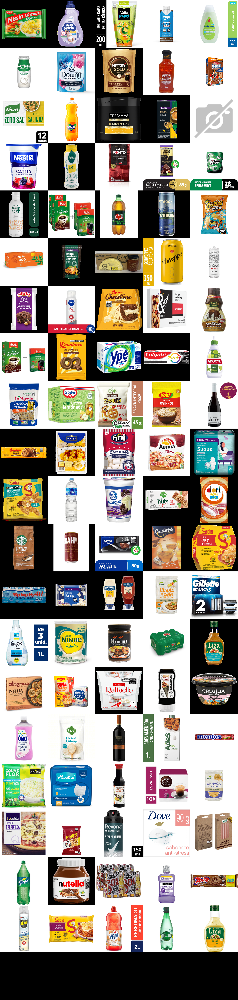

In [36]:
mosaic(best_cart)